# 🐶 Multi-class Dog Breed Classification

This notebook builds an multi-class image classifier using TensorFlow and Hub .

## 1. Problem

Identifying the breed of a dog given an image of a dog .

## 2. Data

The data w'ere using is from : https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image .

## 4. Features

Some info about the data :  
 *  We're dealing with images (untructured data) so it's probably best we use deep learning / transfer learning
 * There are 120 breeds of dogs (this means there are 120 different classes).
 * There are around 10,000 + images in the training set
 (these images have labels)
 * There are around 10,000 + images in the test set
 (these images have no labels , beacause we'll want to predict them) .


In [7]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/My Drive/Colab Notebooks/dog-breed-identification.zip" -d "drive/My Drive/Colab Notebooks"

Get out workspace ready

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [8]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub

print(f"TF version {tf.__version__}")
print(f"TF Hub version : {hub.__version__}")

# Check for GPU availability
print("GPU" , "available (YESSS!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version 2.18.0
TF Hub version : 0.16.1
GPU not available :(


## Getting our data ready (turning into Tensors)

With all machine learning models , our data has to be in numerical format . So that's what we'll be doing first . Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels .

In [9]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Colab Notebooks/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

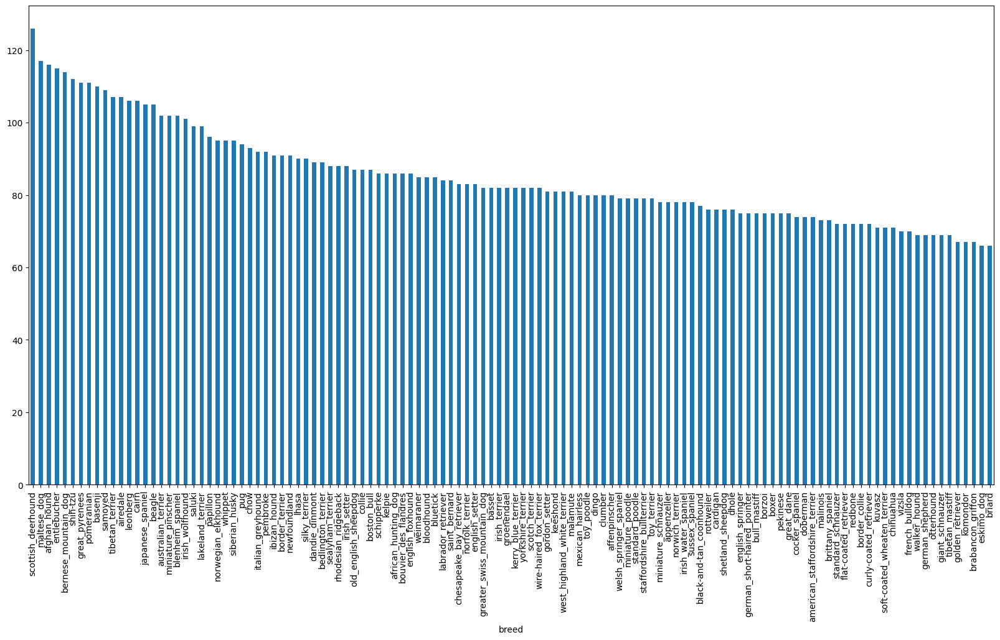

In [11]:
# How many images are there of each breed ?

labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [12]:
labels_csv["breed"].value_counts().median()

82.0

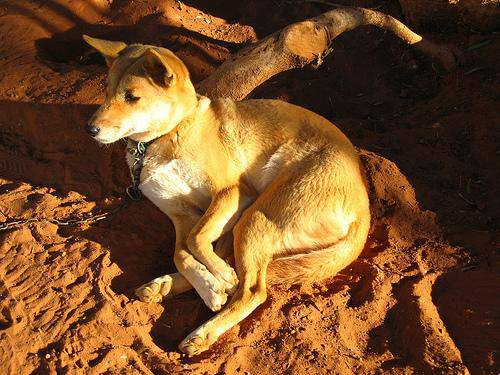

In [13]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames .

In [14]:
# Create pathnames from Image ID's
filenames = ["drive/MyDrive/Colab Notebooks/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [15]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/train/")) == len(filenames) :
  print("Filenames match actual amount of files !!! Proceed ")
else :
  print("Filenames do not match actual amount of files , check the target directory.")

Filenames match actual amount of files !!! Proceed 


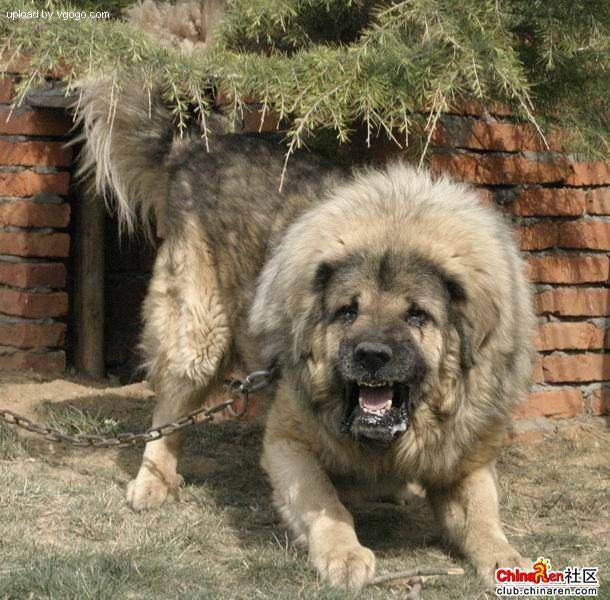

In [16]:
# One more check
Image(filenames[9000])

In [17]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list , let's prepare our labels


In [18]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) -> to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
len(labels)

10222

In [20]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames) :
  print("Number of labels matches number of filenames!")
else :
  print("Number of labels does not match number of filenames , check data directories!")

Number of labels matches number of filenames!


In [21]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [22]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [23]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [24]:
len(boolean_labels)

10222

In [25]:
# Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [26]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [27]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [28]:
filenames[:10]

['drive/MyDrive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set , we're going to create our own.

In [29]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [30]:
len(filenames)

10222

We're going to start off experimenting with -1000 images and increase as needed .

In [31]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider" , min:1000 , max:10000 , step:1000}

In [32]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train , X_val , y_train , y_val = train_test_split(X[:NUM_IMAGES] , y[:NUM_IMAGES] , test_size=0.2 , random_state=42)

len(X_train) , len(y_train) , len(X_val) , len(y_val)

(800, 800, 200, 200)

In [33]:
# Let's have a geez at the training data
X_train[:5] , y_train[:2]

(['drive/MyDrive/Colab Notebooks/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Notebooks/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Notebooks/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things :

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable , `image`
3. Turn out `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224 , 224)
5. Return the modifier `image`

In [34]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [35]:
print(image.max()) , print(image.min())

255
0


(None, None)

In [36]:
# This is an array numpy
print(image[:2])

[[[ 89 137  89]
  [ 76 124  76]
  [ 63 111  61]
  ...
  [ 77 133  86]
  [ 76 134  86]
  [ 76 134  86]]

 [[ 72 119  75]
  [ 67 114  68]
  [ 63 110  64]
  ...
  [ 75 131  84]
  [ 74 132  84]
  [ 74 132  84]]]


In [37]:
# This is the Tensor : turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor , let's make a function to preprocess them.

In [38]:
# Define image size
IMG_SIZE = 224

# Create a function preprocessing images
def process_image(image_path , img_size=IMG_SIZE):
   """
     Takes an image file path and turns the image into Tensor
   """

   # Read in an image file
   image = tf.io.read_file(image_path)

   # Turn the jpeg image into numerical Tensor with 3 colour channels (Red , Green , Blue)
   image = tf.image.decode_jpeg(image, channels=3)

   # Convert the colour chanel values from 0-255 to 0-1 values - normalization
   image = tf.image.convert_image_dtype(image , tf.float32)

   # Resize the image to our desired value (224,224)
   image = tf.image.resize(image , size=[IMG_SIZE , IMG_SIZE])

   return image

## Turning our data into batches

Why turn our data into batches ?

Let's say you trying to process 10,000+ images in one go ... they all might not fit into memory

So that's why we do about 32 images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively , we need our data in the form of Tensor tuples which look like this :

`(image , label)`

In [39]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label) :
   """
    Takes an image file path name and the associated label,
    processes the image and returns a tuple of (image,label).
   """
   image = process_image(image_path)
   return image , label

In [40]:
# Demo of the above
(process_image(X[42]) , y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn data into tuples of Tensors in the form : `(image , label)` , let's make a function to turn all our data (`X` & `y`) into batches !

In [41]:
from ast import Return
# Define the batch size , 32 is a good start
BATCH_SIZE = 32

# Create function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
   """
      Creates batches of data out of image (X) and label (y) pairs.
      Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
      Also accepts test data as input (no labels).
   """

   # If the data is a test dataset , we probably don't have labels
   if test_data:
     print("Creating test data batches...")
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
     data_batch = data.map(process_image).batch(BATCH_SIZE)
     return data_batch

   # If the data is a valid dataset , we don't need shuffle it
   elif valid_data:
     print("Creating validation data batches...")
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X) # Filepaths
                                               ,tf.constant(y))) # labels
     data_batch = data.map(get_image_label).batch(BATCH_SIZE)
     return data_batch

   else :
      print("Creating training data batches...")
      # Turn filepaths and labels into Tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                                tf.constant(y))) # labels
      # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
      data = data.shuffle(buffer_size=len(X))

      # Create (image , label) tuples (this also turns the image path into a preprocess image)
      data = data.map(get_image_label)

      # Turn the training data into batches
      data_batch = data.batch(BATCH_SIZE)

   return data_batch

In [42]:
# Create training and validation data batches
train_data = create_data_batches(X_train , y_train)
val_data = create_data_batches(X_val , y_val , valid_data=True)

Creating training data batches...
Creating validation data batches...


In [43]:
# Check out the different atributes of our data batches
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches , however , these can be a little hard to understand , let's visualize them!



In [44]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images , labels):
   """
     Displays 25 images from a data batch.
   """

   # Setup the figure
   plt.figure(figsize=(10,10))

   # Loop through 25 (for displaying 25 images)
   for i in range(25):
     # Create subplots (5 rows , 5 columns)
     ax = plt.subplot(5,5,i+1)
     # Display an image
     plt.imshow(images[i])
     # Add the image label as the title
     plt.title(unique_breeds[labels[i].argmax()])
     # Turn the grids lines off
     plt.axis("off")

   plt.show()

In [45]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [46]:
train_images , train_labels = next(train_data.as_numpy_iterator())
train_images , train_labels

(array([[[[0.68235296, 0.73333335, 0.8000001 ],
          [0.6856793 , 0.7366597 , 0.8033264 ],
          [0.6904346 , 0.74141496, 0.8080817 ],
          ...,
          [0.6594342 , 0.706493  , 0.75355184],
          [0.67058825, 0.7176471 , 0.7803922 ],
          [0.67058825, 0.7176471 , 0.7803922 ]],
 
         [[0.68235296, 0.73333335, 0.8000001 ],
          [0.6861138 , 0.73709416, 0.8037609 ],
          [0.6901961 , 0.7411765 , 0.8078432 ],
          ...,
          [0.6809246 , 0.7279834 , 0.7750423 ],
          [0.67058825, 0.7176471 , 0.7803922 ],
          [0.67058825, 0.7176471 , 0.7803922 ]],
 
         [[0.6871236 , 0.738104  , 0.8047707 ],
          [0.6862745 , 0.7372549 , 0.80392164],
          [0.6865214 , 0.7375018 , 0.8041685 ],
          ...,
          [0.68087023, 0.72792906, 0.77498794],
          [0.6801296 , 0.7271884 , 0.7830232 ],
          [0.6801296 , 0.7271884 , 0.78823537]],
 
         ...,
 
         [[0.22429891, 0.4133797 , 0.5206933 ],
          [0.22605

In [47]:
len(train_images) , len(train_labels)

(32, 32)

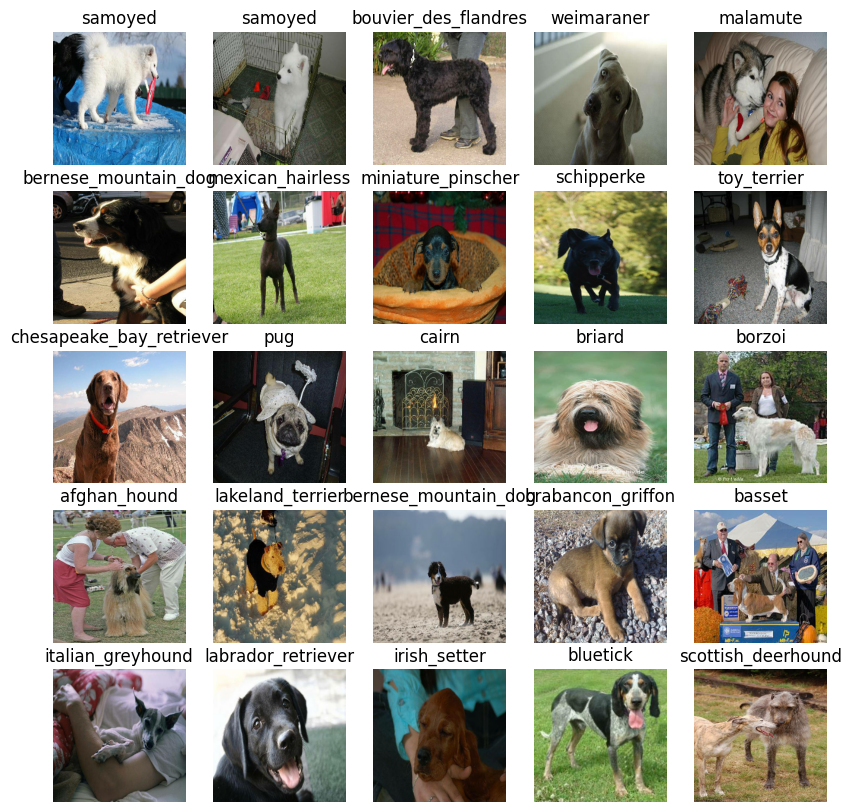

In [48]:
# Now let's visualize the data in a training batch
show_25_images(train_images , train_labels)

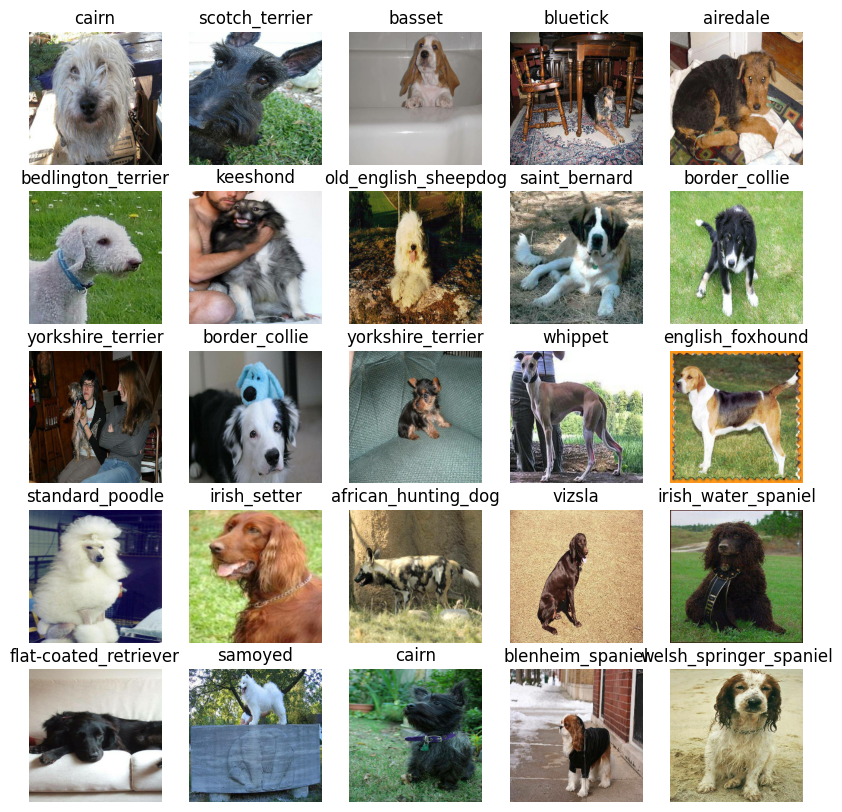

In [49]:
# Now let's visualize our validation set
val_iamges , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_iamges , val_labels)

# Building a model

Before we build a model, there are few things we need to define :
* The input shape (our images shape , in the form of Tensors) to our model.
* The output shape (image labels , in the form of Tensors) of our model .
* The URL of the model we want to use :  https://www.kaggle.com/models/google/mobilenet-v2/TfJs/035-128-classification/3

In [50]:
IMG_SIZE

224

In [51]:
# Setup input shape to the model
INPUT_SHAPE = [None , IMG_SIZE , IMG_SIZE , 3] # batch , height , width , colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"

# Now we've got our inputs , outputs and model ready to go . Let's put them together into a Keras deep learning model.

Knowing this , let's create a function which :
* Takes the input shape , output shape and the model we've chossen as patern .
* Defines the layers in a Keras model in sequential fashion (do this first , then this , then that ).
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape tl'll be getting )
* Return the model .



In [52]:
import tf_keras as keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE , output_shape=OUTPUT_SHAPE , model_url=MODEL_URL):
   print("Building model with : " , MODEL_URL)

   # Setup the model layers
   model = keras.Sequential([hub.KerasLayer(MODEL_URL) , # Layer 1 (input layer)])
                                keras.layers.Dense(units=OUTPUT_SHAPE,
                                                      activation="softmax") # Layer 2 (output layer)
                               ])
   # Compile the model
   model.compile(
       loss=keras.losses.CategoricalCrossentropy(),
       optimizer=keras.optimizers.Adam(),
       metrics=["accuracy"]
   )

   # Build the model
   model.build(INPUT_SHAPE)


   return model

In [53]:
model = create_model()
model.summary()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1664)              3766048   
                                                                 
 dense (Dense)               (None, 120)               199800    
                                                                 
Total params: 3965848 (15.13 MB)
Trainable params: 199800 (780.47 KB)
Non-trainable params: 3766048 (14.37 MB)
_________________________________________________________________


In [54]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress , check its progress or stop training early if a model stops improving .

We'll create two callbacks , one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long .

### TensorBoard Callback

To setup a TensorFlow callback , we need to do 3 things :
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function .
3. Visualize our models training logs with the `%tensorboard` magic function(we'll do this after model training)

In [55]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [56]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
   # Create a log directory for storing TensorBoard logs
   logdir = os.path.join("drive/MyDrive/Colab Notebooks/logs",
                         # Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
   return keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving



In [57]:
# Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images , to make sure everything is working .

In [58]:
NUM_EPOCHS = 100 #@param {type:"slider" , min:10 , max:100 , step:10}

In [59]:
# Check to make sure we still running on a GPU
print("GPU" , "available (YESSS!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


Let's create a function using `create_model()`

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data , validation data , number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [60]:
# Build the function to train and return a trained model
def train_model():
  """
    Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitting model
  return model

In [61]:
# Fit the model to the data
model = train_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Epoch 1/100
25/25 [==============================] - 211s 7s/step - loss: 4.2639 - accuracy: 0.1375 - val_loss: 3.1343 - val_accuracy: 0.3600
Epoch 2/100
25/25 [==============================] - 55s 2s/step - loss: 1.4453 - accuracy: 0.7750 - val_loss: 1.8708 - val_accuracy: 0.5650
Epoch 3/100
25/25 [==============================] - 65s 3s/step - loss: 0.5364 - accuracy: 0.9550 - val_loss: 1.4691 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 62s 3s/step - loss: 0.2701 - accuracy: 0.9900 - val_loss: 1.2858 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 56s 2s/step - loss: 0.1710 - accuracy: 0.9962 - val_loss: 1.2605 - val_accuracy: 0.6800
Epoch 6/100
25/25 [==============================] - 56s 2s/step - loss: 0.1207 - accuracy: 1.0000 - val_loss: 1.2044 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================] - 55s 2

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents .


In [62]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model


In [63]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 18s 2s/step


array([[1.02415937e-03, 1.60344556e-04, 5.96080790e-04, ...,
        2.19089576e-04, 5.44744289e-05, 3.12546571e-03],
       [2.56836321e-03, 8.78008257e-04, 1.33200651e-02, ...,
        1.02146843e-03, 1.83225854e-03, 3.32581287e-04],
       [7.52454480e-06, 1.17703355e-04, 4.98989939e-05, ...,
        1.93398606e-04, 2.97662109e-06, 2.80231558e-04],
       ...,
       [8.93294782e-06, 1.55084737e-04, 3.13279801e-04, ...,
        4.60623414e-05, 2.19046226e-04, 2.92984070e-04],
       [6.55141752e-03, 3.26070440e-04, 1.34426996e-03, ...,
        3.69089830e-04, 4.91199316e-05, 6.09782850e-03],
       [1.93030151e-04, 1.26592975e-04, 1.33628724e-03, ...,
        7.45489355e-03, 7.66184996e-04, 2.14754153e-04]], dtype=float32)

In [64]:
predictions.shape

(200, 120)

In [65]:
len(y_val) , len(unique_breeds)

(200, 120)

In [66]:
len(predictions[0])

120

In [67]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[index])]}")

[6.34282187e-05 9.72283597e-05 1.43966070e-04 9.71567442e-06
 4.06056177e-03 1.78414324e-04 6.84278784e-05 3.24738538e-03
 3.79840508e-02 4.90824059e-02 6.05642435e-06 1.22112528e-04
 3.56147706e-04 6.62950985e-03 3.45350546e-03 9.00595821e-03
 2.33583633e-05 3.61476705e-04 1.41373370e-04 1.93658605e-04
 1.99435999e-05 1.86455599e-03 1.87653568e-05 3.42669518e-05
 1.15474481e-02 4.41470402e-05 7.32477056e-05 1.69426377e-04
 6.56453893e-04 7.12780893e-05 4.57337592e-05 1.33176683e-04
 1.29935419e-04 8.46643597e-05 2.50539852e-05 2.34758281e-05
 1.42014294e-04 5.84104739e-04 2.91254782e-05 2.28353858e-01
 1.05865482e-04 2.18418900e-05 2.58093933e-03 3.23309650e-05
 1.38062911e-04 1.51331587e-05 2.85499962e-04 1.08344236e-03
 1.33743515e-05 4.25061327e-04 4.75686902e-05 3.04394751e-04
 5.61675231e-04 1.87881978e-03 7.25302380e-06 1.22236263e-03
 1.08869521e-04 1.66008249e-04 1.83731863e-05 6.41054867e-05
 2.71047553e-04 1.34874455e-04 9.85013321e-06 9.60997349e-05
 3.36758421e-05 5.883446

Having the above funtionality is great but we want to be able to do it at scale .
And it would be even better if we could see the image the prediction is being made on !

**Note:** Prediction probabilities are also known as confidence levels.

In [68]:
# Turn predictions probabilities into the respective label
def get_pred_label(prediction_probabilities):
    """
      Turns an array of predictions probabilitied into a label .
    """

    return unique_breeds[np.argmax(prediction_probabilities)]
# Get a predicted label based on an array of prediciton probabilities
pred_label = get_pred_label(predictions[70])
pred_label

'mexican_hairless'

Now since our validation data is still in a batch dataset , we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [69]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [70]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
   """
     Takes a batched dataset of (image,label) Tensors and returns seperate arrays
     of images and labels .
   """

   images = []
   labels = []

   # Loop throught unbatched data
   for image , label in data.unbatch().as_numpy_iterator():
       images.append(image)
       labels.append(unique_breeds[np.argmax(label)])
   return images , labels

# Unbatchify the validation data
val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [71]:
images_ = []
labels_ = []

# Loop throught unbatched data
for image,label in val_data.unbatch().as_numpy_iterator() :
   images_.append(image)
   labels_.append(label)

images_[0] , labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [72]:
get_pred_label(labels_[0])

'cairn'

In [73]:
get_pred_label(predictions[0])

'cairn'

In [74]:
get_pred_label(val_labels[0])

'affenpinscher'

How we've got ways to get :
 * Predictions labels
 * Validation labels (truth labels)
 * Validation images

Let's make some functions to make all a bit more visualize .

We'll create a function which :
  * Takes an array of prediction probabilities , an array of truth labels and an array of images and integers .
  * Convert the prediction probabilities to a predictied label .
  * Plot the predicted label , its predicted probability , the truth label and the target image on a single plot .

In [75]:
def plot_pred(prediction_probabilities , labels , images , n=1) :
    """
      View the prediction , ground truth and image for sample n .
    """

    pred_prob , true_label , image = prediction_probabilities[n] , labels[n] , images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the colour of the title depending on if the prediction is right or wrong
    if pred_label == true_label :
      color = "green"
    else :
      color = "red"

    # Change plot title to be predicted , probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)
    plt.show()

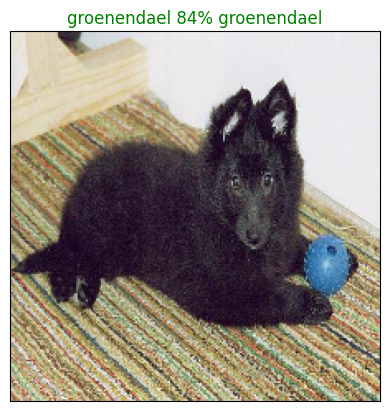

In [76]:
plot_pred(prediction_probabilities=predictions , labels=val_labels , images=val_images , n=77)

Now we've got one function to visualize our models top predictions , let's make another to view our models top 10 predictions

This function will :
  * Take an input of prediction probabilities array and a ground truth array and an integer
  * Find the prediction using `get_pred_label()`
  * Find the top 10 :
    * Prediction prababilities indexes  
    * Prediction probabilities values
    * Prediction labels
  * Plot the top 10 prediction probability values and labels , colouring the true label green


In [77]:
def plot_pred_conf(prediction_probabilities , labels , n=1) :
   """
      Plus the top 10 highest prediction confidence along with the truth label for sample n.
   """

   pred_prob , true_label = prediction_probabilities[n] , labels[n]

   # Get the predicted label
   pred_label = get_pred_label(pred_prob)

   # Find the top 10 prediction confidence indexes
   top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

   # Find a top 10 prediction confidence values
   top_10_pred_values = pred_prob[top_10_pred_indexes]

   # Find the top 10 prediction labels
   top_10_pred_labels = unique_breeds[top_10_pred_indexes]

   # Setup plot
   top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color="grey")
   plt.xticks(np.arange(len(top_10_pred_labels)) , labels=top_10_pred_labels , rotation="vertical")

   # Change color of true label
   if np.isin(true_label , top_10_pred_labels) :
     top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
   else :
     pass

In [78]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.3242967 , 0.25371462, 0.07673773, 0.07467929, 0.04475214,
       0.03205339, 0.02808442, 0.0231834 , 0.02298066, 0.02036779],
      dtype=float32)

In [79]:
predictions[0].max()

np.float32(0.3242967)

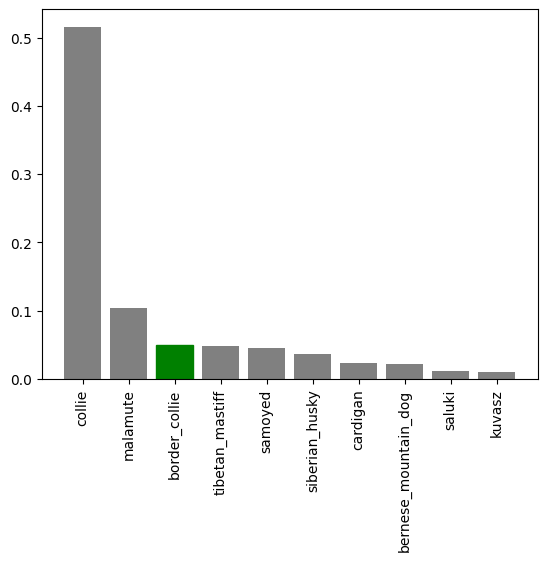

In [80]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

Now we got some functions to help us visualize our predictions and evaluate our model , let's check out a few .

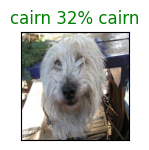

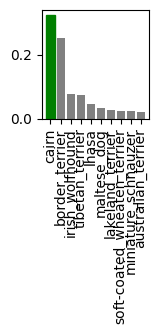

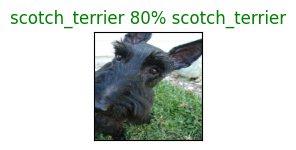

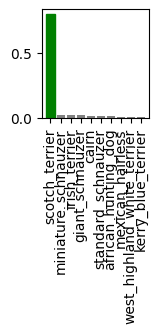

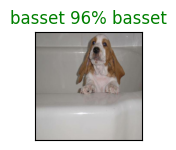

...

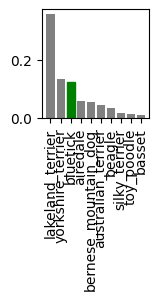

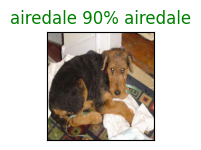

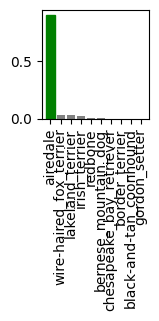

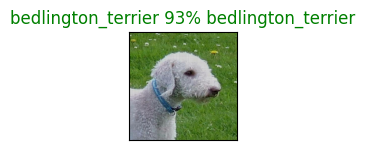

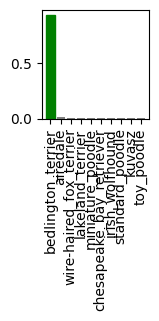

In [81]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

for i in range(num_images) :
   plt.figure()
   plt.subplot(num_rows , 2*num_cols , 2*i+1)
   plot_pred(prediction_probabilities=predictions , labels=val_labels , images=val_images , n=i+i_multiplier)
   plt.subplot(num_rows , 2*num_cols , 2*i+2)
   plot_pred_conf(prediction_probabilities=predictions , labels=val_labels , n=i+i_multiplier)
   plt.show()

# Saving and reloading a model

In [82]:
# Create a function to save a model
def save_model(model , suffix=None):
  """
    Saves a given model in models directory and appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/models" , datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model

  print(f"Saving model to : {model_path}...")
  model.save(model_path)

In [83]:
# Create a function to load a trained model
def load_model(model_path):
  """
    Loads a saved model from a specified path.
  """

  print(f"Loading saved model from : {model_path}")
  model = keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

  return model

Now we've got functions to save and load a trained model

In [84]:
# Save our model trained an 1000 images
save_model(model , suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Colab Notebooks/models/20250511-133319-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [85]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/models/20250511-133319-1000-images-mobilenetv2-Adam.h5')

Loading saved model from : drive/MyDrive/Colab Notebooks/models/20250511-133319-1000-images-mobilenetv2-Adam.h5


In [86]:
# Evaluate the pre-saved model
model.evaluate(val_data)


7/7 [==============================] - 17s 2s/step - loss: 1.1206 - accuracy: 0.7000


[1.1205756664276123, 0.699999988079071]

In [87]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 16s 2s/step - loss: 1.1206 - accuracy: 0.7000


[1.1205756664276123, 0.699999988079071]

## Training a big dog model 🐶 (on the full data)

In [90]:
len(X) , len(y)

(10222, 10222)

In [91]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)


Creating training data batches...


In [92]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [93]:
# Create a model for full model
full_model = create_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


In [95]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data , so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

**Note :** Running the cell below will take a little while (maybe up to 30 minutes) because the GPU has to load all the images into memory.

In [96]:
# Fit the full model to the full data
#full_model.fit(x=full_data , epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard,full_model_early_stopping])

In [97]:
#save_model(full_model , suffix="full-image-set-movilenetv2-Adam")

In [98]:
# Load in the full model
# loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/models/20250511-133319-full-image-set-movilenetv2-Adam.h5')

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches , to make predictions on the test data , we'll have to get it into the same format .

We will use `create_data_batches()` - function that we created for conversion

To make predictions on the test data , we'll :
  * Get the test image filenames .
  * Convert the filenames into test data batches using `create_date_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels)
  * Make a predictions array by passing the test batches to the `predict()` method called on our model .

  

In [99]:
# Load test image filenames
#test_path = "drive/MyDrive/Colab Notebooks/test/"
#test_filenames = [test_path + fname for fname in os.listdir(test_path)]
#test_filenames[:10]

In [100]:
# Create test data batch
#test_data = create_data_batches(test_filenames, test_data=True)

**Note :** Calling `predict()` on our full model and passing in the test data batch will take a long time to run

In [101]:
# Make predictions on test data batch
#test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [102]:
# Save predictions
#np.savetxt("drive/MyDrive/Colab Notebooks/preds_array.csv" , test_predictions , delimiter=",")

In [103]:
# Load predictions
#test_predictions=np.loadtxt("drive/MyDrive/Colab Notebooks/preds_array.csv" , delimiter=",")

# Preparing test dataset predictions for Kaggle

In [104]:
# Create a pandas DataFrame with empty columns
#preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [106]:
# Append test images ID's to predictions DataFrame
#test_ids = [os.path.plitext(path) for path in os.listdir(test_path)]
#preds_df["id"] = test_ids

In [108]:
# Add the prediction probabilities to each dog breed column
#preds_df[unique_breeds] = test_predictions

# Save into csv to export it
#preds_df.to_csv("drive/MyDrive/Colab Notebooks/preds.csv" , index=False)